**SegResNet, FedProx, ISLES'24, Partial Aggregation**

**Transfer learning ISLES'22 -> ISLES'24**

In [32]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [33]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [34]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [35]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "E:/FYP/ISLES24 Split Preprocessed"
print(data_dir)

E:/FYP/ISLES24 Split Preprocessed


In [36]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "E:/FYP/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "E:/FYP/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

# %load_ext tensorboard
# %tensorboard --logdir "D:/F25-156/SegResNet/Federated_SegResNet_logs"

Checkpoints will be saved to: E:/FYP/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: E:/FYP/SegResNet/Federated_SegResNet_logs


In [37]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [38]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [39]:
# target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [40]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [41]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


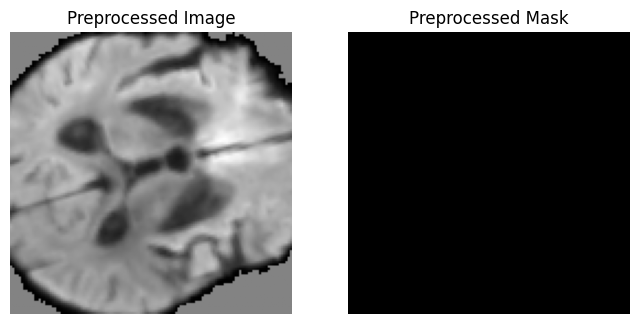

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


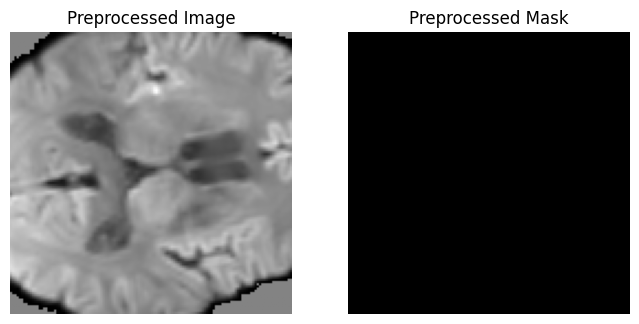


Client 0 dataset size: 50

Client 1
Preprocessed samples: 50

🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


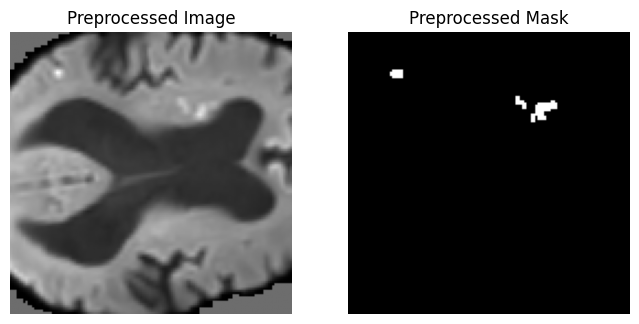

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


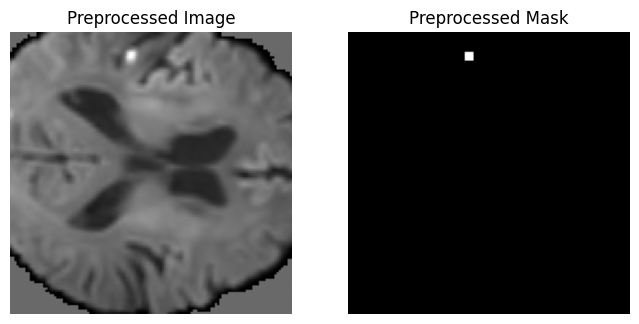


Client 1 dataset size: 50


In [42]:

original_root = "E:/FYP/ISLES24 Split"
processed_root = "E:/FYP/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    # orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    # orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    # dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    # mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(proc_dwi)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    # print("\n🔵 RAW SAMPLES")
    # for idx in sample_indices:

    #     img = nib.load(dwi_files[idx]).get_fdata()
    #     mask = nib.load(mask_files[idx]).get_fdata()

    #     print(
    #         f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
    #         f"Mask values: {torch.unique(torch.tensor(mask))}"
    #     )

    #     mid = img.shape[2] // 2

    #     plt.figure(figsize=(8,4))
    #     plt.subplot(1,2,1)
    #     plt.imshow(img[:,:,mid], cmap="gray")
    #     plt.title("Raw Image")
    #     plt.axis("off")

    #     plt.subplot(1,2,2)
    #     plt.imshow(mask[:,:,mid], cmap="gray")
    #     plt.title("Raw Mask")
    #     plt.axis("off")
    #     plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [43]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [44]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [45]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## SegResNet

In [46]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

In [47]:
# Federated:
# Initial feature extractor
# Full encoder

# Personalized:
# Decoder
# Upsampling path
# Segmentation head

SHARED_LAYER_PREFIXES = [
    "convInit",
    "down_layers"
]

In [48]:
def print_model_weights(model, name="Model", num_values=5):

    print(f"\n{name} Weights Check")

    for param_name, param_tensor in model.state_dict().items():

        # print only floating tensors
        if torch.is_floating_point(param_tensor):

            flat = param_tensor.flatten()

            print(
                f"{param_name}: "
                f"{flat[:num_values].tolist()}"
            )

            # print only first layer for readability
            break

**Client Class**

In [49]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(
            dataset,
            batch_size=1,
            shuffle=True,
        )
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu  # FedProx coefficient
        self.best_dice = 0.0

        # stores encoder params from server
        self.global_encoder_params = None

    def loss_fn(self, y_pred, y_true):
        return 0.7 * self.dice_loss(y_pred, y_true) + 0.3 * self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        state = self.model.state_dict()
        return {
            k: v.cpu().clone()
            for k, v in state.items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

    def set_parameters(self, parameters):
        local_state = self.model.state_dict()

        for k, v in parameters.items():
            if k in local_state:
                local_state[k] = v.to(self.device)

        self.model.load_state_dict(local_state)

    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        global_params = self.global_encoder_params

        for epoch in tqdm(range(1, num_epochs + 1),
                          desc=f"Client {self.id} Epochs",
                          leave=True):

            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx
                if global_params is not None:
                    prox_term = 0.0
                    for name, param in self.model.named_parameters():
                        if name in global_params:
                            prox_term += ((param - global_params[name]) ** 2).sum()

                    loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # metrics
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

            mean_dice = self.dice_metric.aggregate().item()

            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')

            mean_iou = mean_dice / (2 - mean_dice)

            print(
                f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                f"Loss: {epoch_loss/len(self.loader):.4f} | "
                f"Dice: {mean_dice:.4f} | IoU: {mean_iou:.4f} | "
                f"HD95: {mean_hd95:.4f}"
            )

            self.dice_metric.reset()
            self.hd_metric.reset()

        avg_loss = total_loss / (len(self.loader) * num_epochs)

        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [50]:
class Server:
    def __init__(self, val_loader, device, pretrained_path="segresnet_isles22_epoch50.pth"):
        self.device = device
        self.global_model = create_model().to(device)

        # Load pretrained weights
        checkpoint = torch.load(pretrained_path, map_location=device)

        # CASE 1:
        # if checkpoint directly contains state_dict
        if isinstance(checkpoint, dict) and "model_state_dict" not in checkpoint:
            self.global_model.load_state_dict(checkpoint)
            print(f"Loaded pretrained model from {pretrained_path}")

        # CASE 2:
        # if saved as {"model_state_dict": ...}
        else:
            self.global_model.load_state_dict(
                checkpoint["model_state_dict"]
            )
            print(f"Loaded pretrained model from {pretrained_path}")
        
        # PRINT GLOBAL MODEL WEIGHTS
        print_model_weights(self.global_model, "Global Pretrained Model")

        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7 * self.dice_loss(y_pred, y_true) + 0.3 * self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        global_state = self.global_model.state_dict()

        shared_keys = client_params_list[0].keys()

        for key in shared_keys:
            if torch.is_floating_point(client_params_list[0][key]):

                avg_param = client_params_list[0][key].clone()

                for i in range(1, len(client_params_list)):
                    avg_param += client_params_list[i][key].to(avg_param.device)

                avg_param /= len(client_params_list)
                global_state[key] = avg_param

        self.global_model.load_state_dict(global_state)

    def distribute(self, clients):
        shared_params = {
            k: v.cpu().clone()
            for k, v in self.global_model.state_dict().items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

        for client in clients:
            client.set_parameters(shared_params)

            #pass encoder params for FedProx
            client.global_encoder_params = {
                k: v.clone().detach().to(client.device)
                for k, v in shared_params.items()
            }
            print_model_weights( client.model, f"Client {client.id}")

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()

        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')

        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")

            print(f"Best global model updated with Dice={mean_dice:.4f}")

        return avg_loss, mean_dice, mean_iou, mean_hd95
    
    def validate_client_on_server(self, client):
        """
        Validate an individual client model using the SERVER validation dataset.
        """

        client.model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:

                images = batch["image"].to(self.device, dtype=torch.float32)
                masks  = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = client.model(images)

                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()

                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)

        mean_dice = self.dice_metric.aggregate().item()

        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float("nan")

        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # ==========================
        # BEST MODEL TRACKING
        # ==========================

        if mean_dice > client.best_dice:
            client.best_dice = mean_dice

            torch.save(
                {
                    "client_id": client.id,
                    "model_state_dict": client.model.state_dict(),
                    "dice": mean_dice,
                    "iou": mean_iou,
                    "hd95": mean_hd95,
                    "loss": avg_loss,
                },
                f"best_client_{client.id}.pth"
            )

            print(
                f"Best validation model updated for Client {client.id} "
                f"with Dice={mean_dice:.4f}"
            )

        return avg_loss, mean_dice, mean_iou, mean_hd95

In [51]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device, pretrained_path="segresnet_isles22_epoch50.pth")

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


In [52]:
shared_keys = list(server.global_model.state_dict().keys())
print(shared_keys)

['convInit.conv.weight', 'down_layers.0.1.norm1.weight', 'down_layers.0.1.norm1.bias', 'down_layers.0.1.norm2.weight', 'down_layers.0.1.norm2.bias', 'down_layers.0.1.conv1.conv.weight', 'down_layers.0.1.conv2.conv.weight', 'down_layers.1.0.conv.weight', 'down_layers.1.1.norm1.weight', 'down_layers.1.1.norm1.bias', 'down_layers.1.1.norm2.weight', 'down_layers.1.1.norm2.bias', 'down_layers.1.1.conv1.conv.weight', 'down_layers.1.1.conv2.conv.weight', 'down_layers.1.2.norm1.weight', 'down_layers.1.2.norm1.bias', 'down_layers.1.2.norm2.weight', 'down_layers.1.2.norm2.bias', 'down_layers.1.2.conv1.conv.weight', 'down_layers.1.2.conv2.conv.weight', 'down_layers.2.0.conv.weight', 'down_layers.2.1.norm1.weight', 'down_layers.2.1.norm1.bias', 'down_layers.2.1.norm2.weight', 'down_layers.2.1.norm2.bias', 'down_layers.2.1.conv1.conv.weight', 'down_layers.2.1.conv2.conv.weight', 'down_layers.2.2.norm1.weight', 'down_layers.2.2.norm1.bias', 'down_layers.2.2.norm2.weight', 'down_layers.2.2.norm2.bias

**Federated Training loop**

In [53]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}
previous_dice = 0

# Initial distribute before loop starts
server.distribute(clients)

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)

        params = client.get_parameters()
        client_params.append(params)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client encoder ----
    server.aggregate(client_params)
    
    # ---- Distribute global encoder ----
    server.distribute(clients)

    client_metrics = []

    for client in clients:

        loss, dice, iou, hd95 = server.validate_client_on_server(client)

        client_metrics.append((loss, dice, iou, hd95))

        # Print separate client validation
        print(
            f"Client {client.id} Validation | "
            f"Loss={loss:.4f} | Dice={dice:.4f} | "
            f"IoU={iou:.4f} | HD95={hd95:.4f}"
        )


    # ============================
    # COMBINED VALIDATION METRICS
    # ============================

    val_loss = sum(x[0] for x in client_metrics) / len(client_metrics)
    val_dice = sum(x[1] for x in client_metrics) / len(client_metrics)
    val_iou  = sum(x[2] for x in client_metrics) / len(client_metrics)

    valid_hd95 = [x[3] for x in client_metrics if not np.isnan(x[3])]
    val_hd95 = (
        sum(valid_hd95) / len(valid_hd95)
        if len(valid_hd95) > 0
        else float("nan")
    )


    # Save global history
    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)


    # TensorBoard combined validation
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    # Print combined validation
    print(
        f"\n(Gloabl) Combined Validation | "
        f"Loss={val_loss:.4f} | Dice={val_dice:.4f} | "
        f"IoU={val_iou:.4f} | HD95={val_hd95:.4f}"
    )

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


Client 0 Weights Check
convInit.conv.weight: [-0.04282276704907417, 0.03777192533016205, -0.08304842561483383, 0.13256610929965973, 0.19442035257816315]

Client 1 Weights Check
convInit.conv.weight: [-0.04282276704907417, 0.03777192533016205, -0.08304842561483383, 0.13256610929965973, 0.19442035257816315]

--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7737 | Dice: 0.1956 | IoU: 0.1084 | HD95: 69.2161


Client 0 | Epoch 2/20 | Loss: 0.7429 | Dice: 0.4139 | IoU: 0.2609 | HD95: 68.6311


Client 0 | Epoch 3/20 | Loss: 0.7303 | Dice: 0.4232 | IoU: 0.2684 | HD95: 59.2361


Client 0 | Epoch 4/20 | Loss: 0.7198 | Dice: 0.5042 | IoU: 0.3371 | HD95: 50.9111


Client 0 | Epoch 5/20 | Loss: 0.7135 | Dice: 0.4887 | IoU: 0.3234 | HD95: 52.3014


Client 0 | Epoch 6/20 | Loss: 0.7111 | Dice: 0.4787 | IoU: 0.3146 | HD95: 53.7406


Client 0 | Epoch 7/20 | Loss: 0.7076 | Dice: 0.4838 | IoU: 0.3191 | HD95: 51.8537


Client 0 | Epoch 8/20 | Loss: 0.6982 | Dice: 0.5080 | IoU: 0.3405 | HD95: 49.7669


Client 0 | Epoch 9/20 | Loss: 0.6900 | Dice: 0.5532 | IoU: 0.3824 | HD95: 40.7240


Client 0 | Epoch 10/20 | Loss: 0.6854 | Dice: 0.5397 | IoU: 0.3696 | HD95: 44.6234


Client 0 | Epoch 11/20 | Loss: 0.6792 | Dice: 0.5473 | IoU: 0.3768 | HD95: 43.8109


Client 0 | Epoch 12/20 | Loss: 0.6765 | Dice: 0.5402 | IoU: 0.3700 | HD95: 47.8350


Client 0 | Epoch 13/20 | Loss: 0.6707 | Dice: 0.5482 | IoU: 0.3776 | HD95: 40.3684


Client 0 | Epoch 14/20 | Loss: 0.6635 | Dice: 0.5708 | IoU: 0.3994 | HD95: 44.5081


Client 0 | Epoch 15/20 | Loss: 0.6568 | Dice: 0.5665 | IoU: 0.3952 | HD95: 40.1286


Client 0 | Epoch 16/20 | Loss: 0.6530 | Dice: 0.5517 | IoU: 0.3810 | HD95: 44.4950


Client 0 | Epoch 17/20 | Loss: 0.6533 | Dice: 0.5247 | IoU: 0.3557 | HD95: 50.6559


Client 0 | Epoch 18/20 | Loss: 0.6418 | Dice: 0.5708 | IoU: 0.3993 | HD95: 35.4528


Client 0 | Epoch 19/20 | Loss: 0.6359 | Dice: 0.5804 | IoU: 0.4088 | HD95: 35.5257


Clients Training:  50%|█████     | 1/2 [07:39<07:39, 459.92s/it]

Client 0 | Epoch 20/20 | Loss: 0.6308 | Dice: 0.5743 | IoU: 0.4028 | HD95: 40.3363
Client 0 | Loss=0.6867 | Dice=0.5743 | IoU=0.4028 | HD95=40.3363


Client 1 | Epoch 1/20 | Loss: 0.7889 | Dice: 0.3219 | IoU: 0.1918 | HD95: 68.5514


Client 1 | Epoch 2/20 | Loss: 0.7705 | Dice: 0.3694 | IoU: 0.2266 | HD95: 66.4680


Client 1 | Epoch 3/20 | Loss: 0.7552 | Dice: 0.4127 | IoU: 0.2600 | HD95: 59.6250


Client 1 | Epoch 4/20 | Loss: 0.7470 | Dice: 0.4779 | IoU: 0.3140 | HD95: 57.9154


Client 1 | Epoch 5/20 | Loss: 0.7406 | Dice: 0.4466 | IoU: 0.2875 | HD95: 57.2834


Client 1 | Epoch 6/20 | Loss: 0.7329 | Dice: 0.4959 | IoU: 0.3297 | HD95: 48.6362


Client 1 | Epoch 7/20 | Loss: 0.7282 | Dice: 0.5129 | IoU: 0.3449 | HD95: 45.1619


Client 1 | Epoch 8/20 | Loss: 0.7277 | Dice: 0.4829 | IoU: 0.3183 | HD95: 50.7978


Client 1 | Epoch 9/20 | Loss: 0.7221 | Dice: 0.4723 | IoU: 0.3092 | HD95: 49.0724


Client 1 | Epoch 10/20 | Loss: 0.7123 | Dice: 0.5454 | IoU: 0.3749 | HD95: 39.4500


Client 1 | Epoch 11/20 | Loss: 0.7067 | Dice: 0.5518 | IoU: 0.3810 | HD95: 42.5632


Client 1 | Epoch 12/20 | Loss: 0.7009 | Dice: 0.5603 | IoU: 0.3892 | HD95: 34.1543


Client 1 | Epoch 13/20 | Loss: 0.7031 | Dice: 0.5211 | IoU: 0.3524 | HD95: 46.3359


Client 1 | Epoch 14/20 | Loss: 0.7004 | Dice: 0.4959 | IoU: 0.3297 | HD95: 43.8173


Client 1 | Epoch 15/20 | Loss: 0.6897 | Dice: 0.5458 | IoU: 0.3753 | HD95: 38.7277


Client 1 | Epoch 16/20 | Loss: 0.6812 | Dice: 0.5770 | IoU: 0.4055 | HD95: 33.0509


Client 1 | Epoch 17/20 | Loss: 0.6759 | Dice: 0.5757 | IoU: 0.4042 | HD95: 34.4797


Client 1 | Epoch 18/20 | Loss: 0.6764 | Dice: 0.5388 | IoU: 0.3687 | HD95: 41.2352


Client 1 | Epoch 19/20 | Loss: 0.6702 | Dice: 0.5422 | IoU: 0.3719 | HD95: 38.0551


Client 1 Epochs: 100%|██████████| 20/20 [07:43<00:00, 23.16s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.6610 | Dice: 0.5840 | IoU: 0.4124 | HD95: 31.5522
Client 1 | Loss=0.7145 | Dice=0.5840 | IoU=0.4124 | HD95=31.5522

Client 0 Weights Check
convInit.conv.weight: [-0.05059600993990898, 0.02847599983215332, -0.09056325256824493, 0.12700942158699036, 0.1872139275074005]

Client 1 Weights Check
convInit.conv.weight: [-0.05059600993990898, 0.02847599983215332, -0.09056325256824493, 0.12700942158699036, 0.1872139275074005]


Best validation model updated for Client 0 with Dice=0.5576
Client 0 Validation | Loss=0.6033 | Dice=0.5576 | IoU=0.3866 | HD95=42.5701
Best validation model updated for Client 1 with Dice=0.6067
Client 1 Validation | Loss=0.6123 | Dice=0.6067 | IoU=0.4354 | HD95=31.9061

(Gloabl) Combined Validation | Loss=0.6078 | Dice=0.5822 | IoU=0.4110 | HD95=37.2381
Checkpoint saved for round 1 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6229 | Dice: 0.5670 | IoU: 0.3957 | HD95: 38.7281


Client 0 | Epoch 2/20 | Loss: 0.6144 | Dice: 0.5881 | IoU: 0.4165 | HD95: 33.4798


Client 0 | Epoch 3/20 | Loss: 0.6106 | Dice: 0.5748 | IoU: 0.4033 | HD95: 36.6451


Client 0 | Epoch 4/20 | Loss: 0.6153 | Dice: 0.5285 | IoU: 0.3592 | HD95: 44.1809


Client 0 | Epoch 5/20 | Loss: 0.5981 | Dice: 0.5958 | IoU: 0.4243 | HD95: 34.0403


Client 0 | Epoch 6/20 | Loss: 0.5928 | Dice: 0.6047 | IoU: 0.4334 | HD95: 31.4185


Client 0 | Epoch 7/20 | Loss: 0.5872 | Dice: 0.6183 | IoU: 0.4475 | HD95: 31.8749


Client 0 | Epoch 8/20 | Loss: 0.5784 | Dice: 0.6013 | IoU: 0.4299 | HD95: 29.4607


Client 0 | Epoch 9/20 | Loss: 0.5723 | Dice: 0.6268 | IoU: 0.4565 | HD95: 29.2158


Client 0 | Epoch 10/20 | Loss: 0.5634 | Dice: 0.6241 | IoU: 0.4536 | HD95: 27.5846


Client 0 | Epoch 11/20 | Loss: 0.5590 | Dice: 0.6261 | IoU: 0.4557 | HD95: 27.8599


Client 0 | Epoch 12/20 | Loss: 0.5508 | Dice: 0.6459 | IoU: 0.4770 | HD95: 25.8435


Client 0 | Epoch 13/20 | Loss: 0.5460 | Dice: 0.6307 | IoU: 0.4606 | HD95: 29.2925


Client 0 | Epoch 14/20 | Loss: 0.5412 | Dice: 0.6273 | IoU: 0.4569 | HD95: 25.1607


Client 0 | Epoch 15/20 | Loss: 0.5309 | Dice: 0.6427 | IoU: 0.4735 | HD95: 26.0911


Client 0 | Epoch 16/20 | Loss: 0.5302 | Dice: 0.6168 | IoU: 0.4459 | HD95: 36.3095


Client 0 | Epoch 17/20 | Loss: 0.5230 | Dice: 0.6172 | IoU: 0.4463 | HD95: 32.1085


Client 0 | Epoch 18/20 | Loss: 0.5166 | Dice: 0.6165 | IoU: 0.4456 | HD95: 30.7703


Client 0 | Epoch 19/20 | Loss: 0.5057 | Dice: 0.6443 | IoU: 0.4753 | HD95: 27.1877


Clients Training:  50%|█████     | 1/2 [07:06<07:06, 426.09s/it]

Client 0 | Epoch 20/20 | Loss: 0.5003 | Dice: 0.6481 | IoU: 0.4794 | HD95: 33.4598
Client 0 | Loss=0.5630 | Dice=0.6481 | IoU=0.4794 | HD95=33.4598


Client 1 | Epoch 1/20 | Loss: 0.6517 | Dice: 0.5856 | IoU: 0.4140 | HD95: 33.6093


Client 1 | Epoch 2/20 | Loss: 0.6479 | Dice: 0.5964 | IoU: 0.4249 | HD95: 27.4849


Client 1 | Epoch 3/20 | Loss: 0.6407 | Dice: 0.5930 | IoU: 0.4214 | HD95: 32.0287


Client 1 | Epoch 4/20 | Loss: 0.6346 | Dice: 0.6053 | IoU: 0.4340 | HD95: 26.2944


Client 1 | Epoch 5/20 | Loss: 0.6292 | Dice: 0.6040 | IoU: 0.4326 | HD95: 25.0713


Client 1 | Epoch 6/20 | Loss: 0.6257 | Dice: 0.6038 | IoU: 0.4324 | HD95: 24.2970


Client 1 | Epoch 7/20 | Loss: 0.6181 | Dice: 0.6032 | IoU: 0.4318 | HD95: 28.7852


Client 1 | Epoch 8/20 | Loss: 0.6348 | Dice: 0.5283 | IoU: 0.3590 | HD95: 43.1994


Client 1 | Epoch 9/20 | Loss: 0.6165 | Dice: 0.5634 | IoU: 0.3922 | HD95: 35.8467


Client 1 | Epoch 10/20 | Loss: 0.6039 | Dice: 0.5758 | IoU: 0.4043 | HD95: 27.5134


Client 1 | Epoch 11/20 | Loss: 0.5941 | Dice: 0.6231 | IoU: 0.4525 | HD95: 27.2798


Client 1 | Epoch 12/20 | Loss: 0.5858 | Dice: 0.6341 | IoU: 0.4643 | HD95: 24.0081


Client 1 | Epoch 13/20 | Loss: 0.5798 | Dice: 0.6230 | IoU: 0.4525 | HD95: 23.7823


Client 1 | Epoch 14/20 | Loss: 0.5745 | Dice: 0.6229 | IoU: 0.4523 | HD95: 26.1934


Client 1 | Epoch 15/20 | Loss: 0.5750 | Dice: 0.5885 | IoU: 0.4169 | HD95: 26.7598


Client 1 | Epoch 16/20 | Loss: 0.5589 | Dice: 0.6510 | IoU: 0.4825 | HD95: 23.6583


Client 1 | Epoch 17/20 | Loss: 0.5507 | Dice: 0.6419 | IoU: 0.4726 | HD95: 23.8050


Client 1 | Epoch 18/20 | Loss: 0.5412 | Dice: 0.6574 | IoU: 0.4896 | HD95: 20.8992


Client 1 | Epoch 19/20 | Loss: 0.5632 | Dice: 0.5711 | IoU: 0.3997 | HD95: 33.0303


Client 1 Epochs: 100%|██████████| 20/20 [07:16<00:00, 21.84s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.5845 | Dice: 0.4709 | IoU: 0.3079 | HD95: 49.1868
Client 1 | Loss=0.6005 | Dice=0.4709 | IoU=0.3079 | HD95=49.1868

Client 0 Weights Check
convInit.conv.weight: [-0.05460624396800995, 0.02343691885471344, -0.09395638108253479, 0.1252225637435913, 0.18403363227844238]

Client 1 Weights Check
convInit.conv.weight: [-0.05460624396800995, 0.02343691885471344, -0.09395638108253479, 0.1252225637435913, 0.18403363227844238]


Best validation model updated for Client 0 with Dice=0.6187
Client 0 Validation | Loss=0.4775 | Dice=0.6187 | IoU=0.4479 | HD95=27.9114
Best validation model updated for Client 1 with Dice=0.6209
Client 1 Validation | Loss=0.4923 | Dice=0.6209 | IoU=0.4502 | HD95=35.4260

(Gloabl) Combined Validation | Loss=0.4849 | Dice=0.6198 | IoU=0.4491 | HD95=31.6687
Checkpoint saved for round 2 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4925 | Dice: 0.6292 | IoU: 0.4590 | HD95: 26.5817


Client 0 | Epoch 2/20 | Loss: 0.4857 | Dice: 0.6542 | IoU: 0.4862 | HD95: 24.8767


Client 0 | Epoch 3/20 | Loss: 0.4732 | Dice: 0.6707 | IoU: 0.5045 | HD95: 24.9361


Client 0 | Epoch 4/20 | Loss: 0.4666 | Dice: 0.6711 | IoU: 0.5050 | HD95: 25.8605


Client 0 | Epoch 5/20 | Loss: 0.4573 | Dice: 0.6958 | IoU: 0.5335 | HD95: 18.3632


Client 0 | Epoch 6/20 | Loss: 0.4483 | Dice: 0.7001 | IoU: 0.5386 | HD95: 22.8459


Client 0 | Epoch 7/20 | Loss: 0.4507 | Dice: 0.6628 | IoU: 0.4956 | HD95: 27.9964


Client 0 | Epoch 8/20 | Loss: 0.4450 | Dice: 0.6733 | IoU: 0.5075 | HD95: 26.4243


Client 0 | Epoch 9/20 | Loss: 0.4320 | Dice: 0.6938 | IoU: 0.5311 | HD95: 23.2850


Client 0 | Epoch 10/20 | Loss: 0.4240 | Dice: 0.6877 | IoU: 0.5241 | HD95: 25.3860


Client 0 | Epoch 11/20 | Loss: 0.4350 | Dice: 0.6553 | IoU: 0.4873 | HD95: 28.1600


Client 0 | Epoch 12/20 | Loss: 0.4184 | Dice: 0.6689 | IoU: 0.5025 | HD95: 24.6886


Client 0 | Epoch 13/20 | Loss: 0.4043 | Dice: 0.7022 | IoU: 0.5411 | HD95: 21.5988


Client 0 | Epoch 14/20 | Loss: 0.3956 | Dice: 0.7095 | IoU: 0.5498 | HD95: 18.5505


Client 0 | Epoch 15/20 | Loss: 0.3881 | Dice: 0.7091 | IoU: 0.5493 | HD95: 19.1783


Client 0 | Epoch 16/20 | Loss: 0.3861 | Dice: 0.7010 | IoU: 0.5397 | HD95: 22.5800


Client 0 | Epoch 17/20 | Loss: 0.3794 | Dice: 0.7066 | IoU: 0.5463 | HD95: 23.3576


Client 0 | Epoch 18/20 | Loss: 0.3721 | Dice: 0.7122 | IoU: 0.5531 | HD95: 17.4694


Client 0 | Epoch 19/20 | Loss: 0.3643 | Dice: 0.7123 | IoU: 0.5532 | HD95: 16.7380


Clients Training:  50%|█████     | 1/2 [06:47<06:47, 407.33s/it]

Client 0 | Epoch 20/20 | Loss: 0.3691 | Dice: 0.6820 | IoU: 0.5175 | HD95: 26.9843
Client 0 | Loss=0.4244 | Dice=0.6820 | IoU=0.5175 | HD95=26.9843


Client 1 | Epoch 1/20 | Loss: 0.5370 | Dice: 0.5772 | IoU: 0.4057 | HD95: 32.2955


Client 1 | Epoch 2/20 | Loss: 0.5171 | Dice: 0.6341 | IoU: 0.4642 | HD95: 25.1148


Client 1 | Epoch 3/20 | Loss: 0.5038 | Dice: 0.6786 | IoU: 0.5136 | HD95: 17.2541


Client 1 | Epoch 4/20 | Loss: 0.4934 | Dice: 0.6897 | IoU: 0.5263 | HD95: 14.4163


Client 1 | Epoch 5/20 | Loss: 0.4855 | Dice: 0.6881 | IoU: 0.5245 | HD95: 19.9258


Client 1 | Epoch 6/20 | Loss: 0.4779 | Dice: 0.6821 | IoU: 0.5176 | HD95: 15.2749


Client 1 | Epoch 7/20 | Loss: 0.4825 | Dice: 0.6420 | IoU: 0.4727 | HD95: 29.9812


Client 1 | Epoch 8/20 | Loss: 0.4838 | Dice: 0.6465 | IoU: 0.4777 | HD95: 23.7052


Client 1 | Epoch 9/20 | Loss: 0.4572 | Dice: 0.6822 | IoU: 0.5177 | HD95: 17.2786


Client 1 | Epoch 10/20 | Loss: 0.4460 | Dice: 0.6979 | IoU: 0.5360 | HD95: 15.4709


Client 1 | Epoch 11/20 | Loss: 0.4375 | Dice: 0.6979 | IoU: 0.5360 | HD95: 16.4226


Client 1 | Epoch 12/20 | Loss: 0.4261 | Dice: 0.7124 | IoU: 0.5533 | HD95: 13.2090


Client 1 | Epoch 13/20 | Loss: 0.4231 | Dice: 0.6953 | IoU: 0.5329 | HD95: 19.1464


Client 1 | Epoch 14/20 | Loss: 0.4255 | Dice: 0.6703 | IoU: 0.5040 | HD95: 25.6188


Client 1 | Epoch 15/20 | Loss: 0.4248 | Dice: 0.6676 | IoU: 0.5011 | HD95: 23.4263


Client 1 | Epoch 16/20 | Loss: 0.4436 | Dice: 0.6212 | IoU: 0.4505 | HD95: 28.5485


Client 1 | Epoch 17/20 | Loss: 0.4097 | Dice: 0.6795 | IoU: 0.5146 | HD95: 22.3066


Client 1 | Epoch 18/20 | Loss: 0.3855 | Dice: 0.7219 | IoU: 0.5648 | HD95: 15.6507


Client 1 | Epoch 19/20 | Loss: 0.3756 | Dice: 0.7249 | IoU: 0.5685 | HD95: 13.7562


Client 1 Epochs: 100%|██████████| 20/20 [06:56<00:00, 20.85s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.3629 | Dice: 0.7354 | IoU: 0.5815 | HD95: 13.2323
Client 1 | Loss=0.4499 | Dice=0.7354 | IoU=0.5815 | HD95=13.2323

Client 0 Weights Check
convInit.conv.weight: [-0.0573909729719162, 0.01955343410372734, -0.09757138788700104, 0.12355495989322662, 0.18104839324951172]

Client 1 Weights Check
convInit.conv.weight: [-0.0573909729719162, 0.01955343410372734, -0.09757138788700104, 0.12355495989322662, 0.18104839324951172]


Best validation model updated for Client 0 with Dice=0.7103
Client 0 Validation | Loss=0.3471 | Dice=0.7103 | IoU=0.5507 | HD95=14.2067
Best validation model updated for Client 1 with Dice=0.7106
Client 1 Validation | Loss=0.3304 | Dice=0.7106 | IoU=0.5511 | HD95=18.9940

(Gloabl) Combined Validation | Loss=0.3388 | Dice=0.7104 | IoU=0.5509 | HD95=16.6003
Checkpoint saved for round 3 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3574 | Dice: 0.6947 | IoU: 0.5322 | HD95: 22.4760


Client 0 | Epoch 2/20 | Loss: 0.3459 | Dice: 0.7237 | IoU: 0.5670 | HD95: 14.6025


Client 0 | Epoch 3/20 | Loss: 0.3396 | Dice: 0.7211 | IoU: 0.5638 | HD95: 19.1979


Client 0 | Epoch 4/20 | Loss: 0.3376 | Dice: 0.7110 | IoU: 0.5516 | HD95: 19.2393


Client 0 | Epoch 5/20 | Loss: 0.3496 | Dice: 0.6879 | IoU: 0.5242 | HD95: 21.1406


Client 0 | Epoch 6/20 | Loss: 0.3341 | Dice: 0.7160 | IoU: 0.5577 | HD95: 19.4948


Client 0 | Epoch 7/20 | Loss: 0.3414 | Dice: 0.6843 | IoU: 0.5201 | HD95: 29.4411


Client 0 | Epoch 8/20 | Loss: 0.3216 | Dice: 0.7339 | IoU: 0.5797 | HD95: 18.4650


Client 0 | Epoch 9/20 | Loss: 0.3032 | Dice: 0.7499 | IoU: 0.5999 | HD95: 13.8449


Client 0 | Epoch 10/20 | Loss: 0.3333 | Dice: 0.6924 | IoU: 0.5295 | HD95: 24.8928


Client 0 | Epoch 11/20 | Loss: 0.3339 | Dice: 0.6830 | IoU: 0.5186 | HD95: 21.2042


Client 0 | Epoch 12/20 | Loss: 0.3069 | Dice: 0.7244 | IoU: 0.5679 | HD95: 16.9067


Client 0 | Epoch 13/20 | Loss: 0.2881 | Dice: 0.7487 | IoU: 0.5984 | HD95: 13.2930


Client 0 | Epoch 14/20 | Loss: 0.2827 | Dice: 0.7587 | IoU: 0.6112 | HD95: 12.6234


Client 0 | Epoch 15/20 | Loss: 0.2742 | Dice: 0.7592 | IoU: 0.6119 | HD95: 13.1357


Client 0 | Epoch 16/20 | Loss: 0.3155 | Dice: 0.6923 | IoU: 0.5294 | HD95: 22.4577


Client 0 | Epoch 17/20 | Loss: 0.2886 | Dice: 0.7322 | IoU: 0.5775 | HD95: 16.5684


Client 0 | Epoch 18/20 | Loss: 0.2703 | Dice: 0.7541 | IoU: 0.6053 | HD95: 13.9503


Client 0 | Epoch 19/20 | Loss: 0.2730 | Dice: 0.7511 | IoU: 0.6014 | HD95: 17.3466


Clients Training:  50%|█████     | 1/2 [06:36<06:36, 396.72s/it]

Client 0 | Epoch 20/20 | Loss: 0.2729 | Dice: 0.7434 | IoU: 0.5916 | HD95: 16.4960
Client 0 | Loss=0.3135 | Dice=0.7434 | IoU=0.5916 | HD95=16.4960


Client 1 | Epoch 1/20 | Loss: 0.3540 | Dice: 0.7288 | IoU: 0.5734 | HD95: 13.5402


Client 1 | Epoch 2/20 | Loss: 0.3478 | Dice: 0.7343 | IoU: 0.5802 | HD95: 15.0625


Client 1 | Epoch 3/20 | Loss: 0.3496 | Dice: 0.7088 | IoU: 0.5490 | HD95: 14.2771


Client 1 | Epoch 4/20 | Loss: 0.3412 | Dice: 0.7294 | IoU: 0.5740 | HD95: 13.2819


Client 1 | Epoch 5/20 | Loss: 0.3271 | Dice: 0.7477 | IoU: 0.5970 | HD95: 12.6653


Client 1 | Epoch 6/20 | Loss: 0.3158 | Dice: 0.7571 | IoU: 0.6091 | HD95: 10.9343


Client 1 | Epoch 7/20 | Loss: 0.3111 | Dice: 0.7563 | IoU: 0.6082 | HD95: 12.4666


Client 1 | Epoch 8/20 | Loss: 0.3127 | Dice: 0.7462 | IoU: 0.5952 | HD95: 12.3005


Client 1 | Epoch 9/20 | Loss: 0.3274 | Dice: 0.7151 | IoU: 0.5565 | HD95: 17.7737


Client 1 | Epoch 10/20 | Loss: 0.3398 | Dice: 0.7032 | IoU: 0.5423 | HD95: 21.7206


Client 1 | Epoch 11/20 | Loss: 0.3199 | Dice: 0.7191 | IoU: 0.5614 | HD95: 15.9131


Client 1 | Epoch 12/20 | Loss: 0.3007 | Dice: 0.7470 | IoU: 0.5961 | HD95: 11.9368


Client 1 | Epoch 13/20 | Loss: 0.2916 | Dice: 0.7514 | IoU: 0.6018 | HD95: 15.1548


Client 1 | Epoch 14/20 | Loss: 0.2836 | Dice: 0.7612 | IoU: 0.6144 | HD95: 12.4916


Client 1 | Epoch 15/20 | Loss: 0.2752 | Dice: 0.7654 | IoU: 0.6199 | HD95: 10.1316


Client 1 | Epoch 16/20 | Loss: 0.2781 | Dice: 0.7596 | IoU: 0.6123 | HD95: 9.7055


Client 1 | Epoch 17/20 | Loss: 0.2796 | Dice: 0.7501 | IoU: 0.6001 | HD95: 14.0057


Client 1 | Epoch 18/20 | Loss: 0.2610 | Dice: 0.7779 | IoU: 0.6365 | HD95: 7.4663


Client 1 | Epoch 19/20 | Loss: 0.2554 | Dice: 0.7762 | IoU: 0.6343 | HD95: 8.4017


Client 1 Epochs: 100%|██████████| 20/20 [06:39<00:00, 19.97s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2546 | Dice: 0.7756 | IoU: 0.6334 | HD95: 6.4779
Client 1 | Loss=0.3063 | Dice=0.7756 | IoU=0.6334 | HD95=6.4779

Client 0 Weights Check
convInit.conv.weight: [-0.05854601413011551, 0.018809769302606583, -0.0983070582151413, 0.12430810183286667, 0.18171188235282898]

Client 1 Weights Check
convInit.conv.weight: [-0.05854601413011551, 0.018809769302606583, -0.0983070582151413, 0.12430810183286667, 0.18171188235282898]


Best validation model updated for Client 0 with Dice=0.7109
Client 0 Validation | Loss=0.2685 | Dice=0.7109 | IoU=0.5514 | HD95=10.1506
Best validation model updated for Client 1 with Dice=0.7228
Client 1 Validation | Loss=0.2486 | Dice=0.7228 | IoU=0.5659 | HD95=10.9345

(Gloabl) Combined Validation | Loss=0.2585 | Dice=0.7168 | IoU=0.5587 | HD95=10.5426
Checkpoint saved for round 4 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2577 | Dice: 0.7507 | IoU: 0.6008 | HD95: 15.2224


Client 0 | Epoch 2/20 | Loss: 0.2577 | Dice: 0.7555 | IoU: 0.6070 | HD95: 12.9974


Client 0 | Epoch 3/20 | Loss: 0.2506 | Dice: 0.7636 | IoU: 0.6175 | HD95: 12.2018


Client 0 | Epoch 4/20 | Loss: 0.2441 | Dice: 0.7748 | IoU: 0.6324 | HD95: 12.6866


Client 0 | Epoch 5/20 | Loss: 0.2423 | Dice: 0.7732 | IoU: 0.6303 | HD95: 10.2737


Client 0 | Epoch 6/20 | Loss: 0.2317 | Dice: 0.7860 | IoU: 0.6474 | HD95: 9.3865


Client 0 | Epoch 7/20 | Loss: 0.2412 | Dice: 0.7674 | IoU: 0.6225 | HD95: 13.0427


Client 0 | Epoch 8/20 | Loss: 0.2446 | Dice: 0.7626 | IoU: 0.6163 | HD95: 16.6611


Client 0 | Epoch 9/20 | Loss: 0.2500 | Dice: 0.7540 | IoU: 0.6051 | HD95: 20.8011


Client 0 | Epoch 10/20 | Loss: 0.2738 | Dice: 0.7199 | IoU: 0.5623 | HD95: 17.0711


Client 0 | Epoch 11/20 | Loss: 0.2513 | Dice: 0.7458 | IoU: 0.5946 | HD95: 14.0054


Client 0 | Epoch 12/20 | Loss: 0.2359 | Dice: 0.7680 | IoU: 0.6234 | HD95: 12.1199


Client 0 | Epoch 13/20 | Loss: 0.2238 | Dice: 0.7851 | IoU: 0.6462 | HD95: 9.4224


Client 0 | Epoch 14/20 | Loss: 0.2198 | Dice: 0.7838 | IoU: 0.6445 | HD95: 14.7564


Client 0 | Epoch 15/20 | Loss: 0.2207 | Dice: 0.7809 | IoU: 0.6406 | HD95: 9.8870


Client 0 | Epoch 16/20 | Loss: 0.2197 | Dice: 0.7811 | IoU: 0.6408 | HD95: 12.0441


Client 0 | Epoch 17/20 | Loss: 0.2154 | Dice: 0.7891 | IoU: 0.6517 | HD95: 12.5483


Client 0 | Epoch 18/20 | Loss: 0.2109 | Dice: 0.7938 | IoU: 0.6581 | HD95: 8.6682


Client 0 | Epoch 19/20 | Loss: 0.2028 | Dice: 0.8051 | IoU: 0.6738 | HD95: 7.1938


Clients Training:  50%|█████     | 1/2 [06:29<06:29, 389.71s/it]

Client 0 | Epoch 20/20 | Loss: 0.2110 | Dice: 0.7793 | IoU: 0.6383 | HD95: 11.3752
Client 0 | Loss=0.2352 | Dice=0.7793 | IoU=0.6383 | HD95=11.3752


Client 1 | Epoch 1/20 | Loss: 0.2481 | Dice: 0.7744 | IoU: 0.6318 | HD95: 9.8398


Client 1 | Epoch 2/20 | Loss: 0.2447 | Dice: 0.7755 | IoU: 0.6333 | HD95: 9.0767


Client 1 | Epoch 3/20 | Loss: 0.2428 | Dice: 0.7737 | IoU: 0.6309 | HD95: 9.1175


Client 1 | Epoch 4/20 | Loss: 0.2499 | Dice: 0.7627 | IoU: 0.6164 | HD95: 10.2154


Client 1 | Epoch 5/20 | Loss: 0.2567 | Dice: 0.7492 | IoU: 0.5990 | HD95: 11.8569


Client 1 | Epoch 6/20 | Loss: 0.2445 | Dice: 0.7689 | IoU: 0.6246 | HD95: 11.3625


Client 1 | Epoch 7/20 | Loss: 0.2432 | Dice: 0.7631 | IoU: 0.6170 | HD95: 9.5787


Client 1 | Epoch 8/20 | Loss: 0.2319 | Dice: 0.7801 | IoU: 0.6394 | HD95: 7.8819


Client 1 | Epoch 9/20 | Loss: 0.2271 | Dice: 0.7814 | IoU: 0.6413 | HD95: 7.5617


Client 1 | Epoch 10/20 | Loss: 0.2207 | Dice: 0.7915 | IoU: 0.6550 | HD95: 5.1568


Client 1 | Epoch 11/20 | Loss: 0.2179 | Dice: 0.7925 | IoU: 0.6563 | HD95: 5.1106


Client 1 | Epoch 12/20 | Loss: 0.2162 | Dice: 0.7909 | IoU: 0.6542 | HD95: 4.3061


Client 1 | Epoch 13/20 | Loss: 0.2201 | Dice: 0.7814 | IoU: 0.6413 | HD95: 8.4294


Client 1 | Epoch 14/20 | Loss: 0.2806 | Dice: 0.7078 | IoU: 0.5478 | HD95: 23.3701


Client 1 | Epoch 15/20 | Loss: 0.2946 | Dice: 0.6899 | IoU: 0.5267 | HD95: 25.1538


Client 1 | Epoch 16/20 | Loss: 0.2390 | Dice: 0.7655 | IoU: 0.6201 | HD95: 10.0064


Client 1 | Epoch 17/20 | Loss: 0.2553 | Dice: 0.7356 | IoU: 0.5818 | HD95: 11.8448


Client 1 | Epoch 18/20 | Loss: 0.2556 | Dice: 0.7360 | IoU: 0.5823 | HD95: 17.5761


Client 1 | Epoch 19/20 | Loss: 0.2221 | Dice: 0.7815 | IoU: 0.6413 | HD95: 7.7648


Client 1 Epochs: 100%|██████████| 20/20 [06:34<00:00, 19.74s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2142 | Dice: 0.7876 | IoU: 0.6496 | HD95: 4.6059
Client 1 | Loss=0.2413 | Dice=0.7876 | IoU=0.6496 | HD95=4.6059

Client 0 Weights Check
convInit.conv.weight: [-0.05919531360268593, 0.01753387041389942, -0.09973245114088058, 0.12529554963111877, 0.18190327286720276]

Client 1 Weights Check
convInit.conv.weight: [-0.05919531360268593, 0.01753387041389942, -0.09973245114088058, 0.12529554963111877, 0.18190327286720276]


Client 0 Validation | Loss=0.2379 | Dice=0.7050 | IoU=0.5444 | HD95=12.2716
Client 1 Validation | Loss=0.2310 | Dice=0.7119 | IoU=0.5527 | HD95=11.7090

(Gloabl) Combined Validation | Loss=0.2345 | Dice=0.7084 | IoU=0.5485 | HD95=11.9903
Checkpoint saved for round 5 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2056 | Dice: 0.7862 | IoU: 0.6477 | HD95: 11.3110


Client 0 | Epoch 2/20 | Loss: 0.2018 | Dice: 0.7958 | IoU: 0.6608 | HD95: 8.9472


Client 0 | Epoch 3/20 | Loss: 0.1970 | Dice: 0.8004 | IoU: 0.6673 | HD95: 8.2611


Client 0 | Epoch 4/20 | Loss: 0.2015 | Dice: 0.7890 | IoU: 0.6516 | HD95: 10.4136


Client 0 | Epoch 5/20 | Loss: 0.2194 | Dice: 0.7719 | IoU: 0.6285 | HD95: 14.1264


Client 0 | Epoch 6/20 | Loss: 0.2151 | Dice: 0.7775 | IoU: 0.6359 | HD95: 14.1537


Client 0 | Epoch 7/20 | Loss: 0.2153 | Dice: 0.7695 | IoU: 0.6254 | HD95: 18.8319


Client 0 | Epoch 8/20 | Loss: 0.1929 | Dice: 0.8058 | IoU: 0.6748 | HD95: 7.6324


Client 0 | Epoch 9/20 | Loss: 0.1859 | Dice: 0.8085 | IoU: 0.6785 | HD95: 7.0355


Client 0 | Epoch 10/20 | Loss: 0.1885 | Dice: 0.8090 | IoU: 0.6793 | HD95: 5.7575


Client 0 | Epoch 11/20 | Loss: 0.1896 | Dice: 0.8026 | IoU: 0.6702 | HD95: 8.1100


Client 0 | Epoch 12/20 | Loss: 0.1866 | Dice: 0.8083 | IoU: 0.6783 | HD95: 6.7726


Client 0 | Epoch 13/20 | Loss: 0.1844 | Dice: 0.8032 | IoU: 0.6712 | HD95: 7.9412


Client 0 | Epoch 14/20 | Loss: 0.1825 | Dice: 0.8099 | IoU: 0.6806 | HD95: 5.3320


Client 0 | Epoch 15/20 | Loss: 0.1822 | Dice: 0.8101 | IoU: 0.6808 | HD95: 6.1022


Client 0 | Epoch 16/20 | Loss: 0.1887 | Dice: 0.7978 | IoU: 0.6636 | HD95: 10.6128


Client 0 | Epoch 17/20 | Loss: 0.2239 | Dice: 0.7544 | IoU: 0.6057 | HD95: 20.0897


Client 0 | Epoch 18/20 | Loss: 0.2122 | Dice: 0.7754 | IoU: 0.6332 | HD95: 16.0650


Client 0 | Epoch 19/20 | Loss: 0.1876 | Dice: 0.8026 | IoU: 0.6704 | HD95: 7.4887


Clients Training:  50%|█████     | 1/2 [06:27<06:27, 387.84s/it]

Client 0 | Epoch 20/20 | Loss: 0.1863 | Dice: 0.8015 | IoU: 0.6687 | HD95: 10.9460
Client 0 | Loss=0.1973 | Dice=0.8015 | IoU=0.6687 | HD95=10.9460


Client 1 | Epoch 1/20 | Loss: 0.2032 | Dice: 0.7900 | IoU: 0.6529 | HD95: 6.6696


Client 1 | Epoch 2/20 | Loss: 0.2029 | Dice: 0.7912 | IoU: 0.6545 | HD95: 6.9565


Client 1 | Epoch 3/20 | Loss: 0.1971 | Dice: 0.7992 | IoU: 0.6655 | HD95: 4.8090


Client 1 | Epoch 4/20 | Loss: 0.1987 | Dice: 0.7969 | IoU: 0.6624 | HD95: 4.2620


Client 1 | Epoch 5/20 | Loss: 0.1967 | Dice: 0.7978 | IoU: 0.6636 | HD95: 4.3845


Client 1 | Epoch 6/20 | Loss: 0.1950 | Dice: 0.7988 | IoU: 0.6650 | HD95: 4.2433


Client 1 | Epoch 7/20 | Loss: 0.1917 | Dice: 0.8022 | IoU: 0.6698 | HD95: 4.2791


Client 1 | Epoch 8/20 | Loss: 0.1897 | Dice: 0.8032 | IoU: 0.6711 | HD95: 4.7107


Client 1 | Epoch 9/20 | Loss: 0.1908 | Dice: 0.8020 | IoU: 0.6695 | HD95: 4.8248


Client 1 | Epoch 10/20 | Loss: 0.1881 | Dice: 0.8033 | IoU: 0.6713 | HD95: 4.2943


Client 1 | Epoch 11/20 | Loss: 0.1907 | Dice: 0.8004 | IoU: 0.6672 | HD95: 4.0141


Client 1 | Epoch 12/20 | Loss: 0.1913 | Dice: 0.7973 | IoU: 0.6630 | HD95: 6.7668


Client 1 | Epoch 13/20 | Loss: 0.1862 | Dice: 0.8056 | IoU: 0.6744 | HD95: 5.1566


Client 1 | Epoch 14/20 | Loss: 0.1830 | Dice: 0.8081 | IoU: 0.6780 | HD95: 4.7549


Client 1 | Epoch 15/20 | Loss: 0.1821 | Dice: 0.8087 | IoU: 0.6789 | HD95: 4.2721


Client 1 | Epoch 16/20 | Loss: 0.1837 | Dice: 0.8047 | IoU: 0.6732 | HD95: 4.3844


Client 1 | Epoch 17/20 | Loss: 0.1863 | Dice: 0.8005 | IoU: 0.6673 | HD95: 6.8571


Client 1 | Epoch 18/20 | Loss: 0.1926 | Dice: 0.7940 | IoU: 0.6583 | HD95: 6.8265


Client 1 | Epoch 19/20 | Loss: 0.1943 | Dice: 0.7869 | IoU: 0.6487 | HD95: 7.3977


Client 1 Epochs: 100%|██████████| 20/20 [06:32<00:00, 19.60s/it]
                                                                

Client 1 | Epoch 20/20 | Loss: 0.2056 | Dice: 0.7753 | IoU: 0.6330 | HD95: 9.6143
Client 1 | Loss=0.1925 | Dice=0.7753 | IoU=0.6330 | HD95=9.6143

Client 0 Weights Check
convInit.conv.weight: [-0.059422120451927185, 0.017297301441431046, -0.09962458908557892, 0.12632501125335693, 0.18272683024406433]

Client 1 Weights Check
convInit.conv.weight: [-0.059422120451927185, 0.017297301441431046, -0.09962458908557892, 0.12632501125335693, 0.18272683024406433]


Client 0 Validation | Loss=0.2308 | Dice=0.6972 | IoU=0.5352 | HD95=13.9287
Client 1 Validation | Loss=0.2257 | Dice=0.7038 | IoU=0.5430 | HD95=11.3173

(Gloabl) Combined Validation | Loss=0.2283 | Dice=0.7005 | IoU=0.5391 | HD95=12.6230
Checkpoint saved for round 6 at E:/FYP/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth
No significant Dice improvement for 2 round(s)
Early stopping triggered at round 6 (no Dice improvement for 2 rounds)


In [54]:
#save client models
for client in clients:
    torch.save(client.model.state_dict(), f"client_{client.id}.pth")

**Graph**

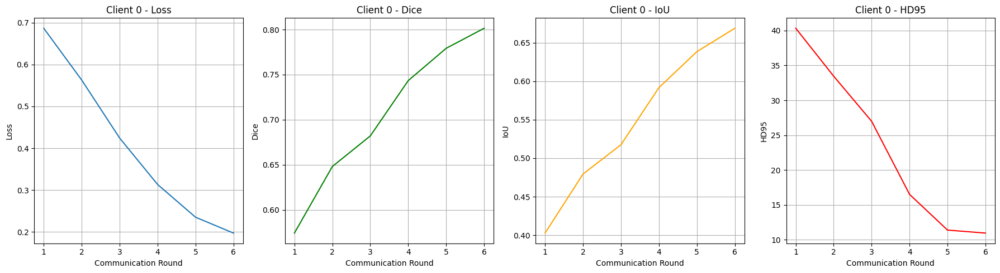

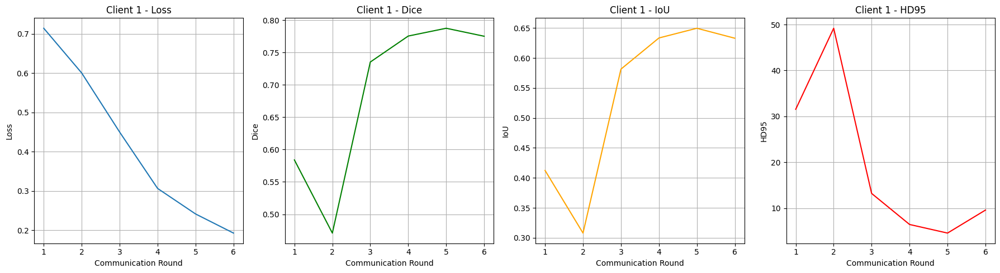

In [55]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

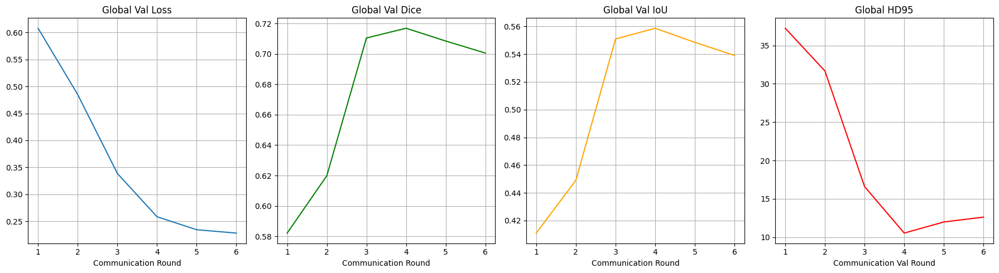

In [56]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [60]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

def load_client_model(client_id, device):
    model = create_model().to(device)
    checkpoint = torch.load(f"best_client_{client_id}.pth", map_location=device)
    model.load_state_dict(checkpoint["model_state_dict"])
    model.eval()
    return model

Test samples: 29


In [61]:
def evaluate_model(model, dataloader, device):
    dice_metric = DiceMetric(include_background=False, reduction="mean")
    hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    model.eval()

    total_loss = 0
    loss_fn = DiceLoss(sigmoid=True)

    with torch.no_grad():
        for batch in dataloader:
            images = batch["image"].to(device, dtype=torch.float32)
            masks  = batch["mask"].to(device, dtype=torch.float32)

            outputs = model(images)

            loss = 0.7 * loss_fn(outputs, masks) + 0.3 * nn.BCEWithLogitsLoss()(outputs, masks)
            total_loss += loss.item()

            preds = (torch.sigmoid(outputs) > 0.5).float()

            dice_metric(preds, masks)

            if masks.sum() > 0 and preds.sum() > 0:
                hd_metric(preds, masks)

    avg_loss = total_loss / len(dataloader)
    dice = dice_metric.aggregate().item()

    try:
        hd95 = hd_metric.aggregate().item()
    except ValueError:
        hd95 = float("nan")

    iou = dice / (2 - dice)

    dice_metric.reset()
    hd_metric.reset()

    return avg_loss, dice, iou, hd95

In [62]:
all_results = []

for client in clients:

    model = load_client_model(client.id, device)

    loss, dice, iou, hd95 = evaluate_model(model, test_loader, device)

    print(
        f"Client {client.id} | "
        f"Loss={loss:.4f} | Dice={dice:.4f} | IoU={iou:.4f} | HD95={hd95:.4f}"
    )

    all_results.append((loss, dice, iou, hd95))

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


Client 0 | Loss=0.2772 | Dice=0.6984 | IoU=0.5365 | HD95=14.3489
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1

In [63]:
print("\n===== CLIENT-WISE FINAL SUMMARY =====")

for idx, client in enumerate(clients):

    loss = all_results[idx][0]
    dice = all_results[idx][1]
    iou  = all_results[idx][2]
    hd95 = all_results[idx][3]

    print(f"\nClient {client.id} Results:")
    print(f"Loss : {loss:.4f}")
    print(f"Dice : {dice:.4f}")
    print(f"IoU  : {iou:.4f}")

    if not np.isnan(hd95):
        print(f"HD95 : {hd95:.4f}")
    else:
        print("HD95 : NaN")


===== CLIENT-WISE FINAL SUMMARY =====

Client 0 Results:
Loss : 0.2772
Dice : 0.6984
IoU  : 0.5365
HD95 : 14.3489

Client 1 Results:
Loss : 0.2617
Dice : 0.7051
IoU  : 0.5445
HD95 : 17.6264


**Visualize**

In [64]:
def visualize_model(model, dataset, device, client_id, num_samples=10):

    model.eval()

    for i in range(num_samples):

        sample = dataset[i]

        image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)

        image = sample["image"][0].cpu().numpy()
        mask  = sample["mask"][0].cpu().numpy()

        with torch.no_grad():
            output = model(image_tensor)
            pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

        mid = image.shape[2] // 2

        img_slice  = image[:, :, mid]
        mask_slice = mask[:, :, mid]
        pred_slice = pred[:, :, mid]

        plt.figure(figsize=(12,4))
        plt.suptitle(f"Client {client_id} | Sample {i}")

        plt.subplot(1,3,1)
        plt.imshow(img_slice, cmap="gray")
        plt.title("Input")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_slice, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_slice, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.show()

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.


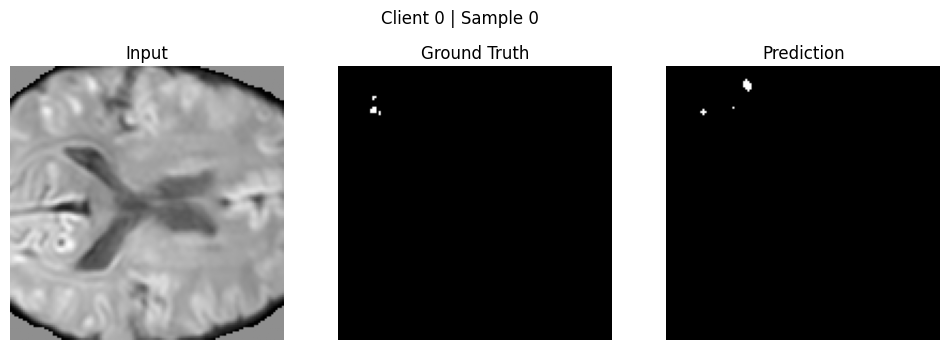

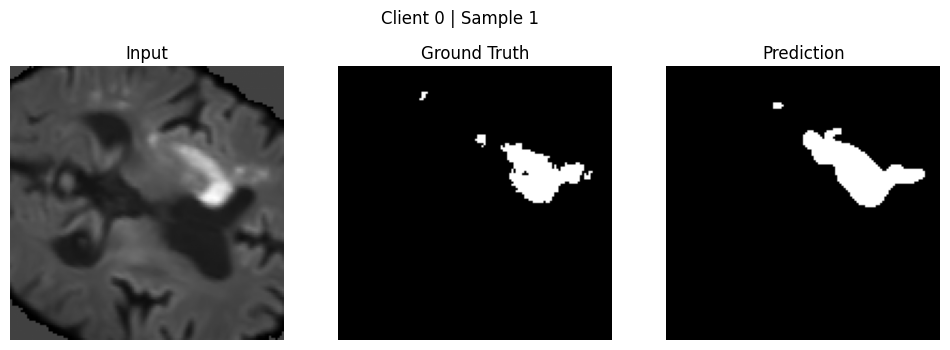

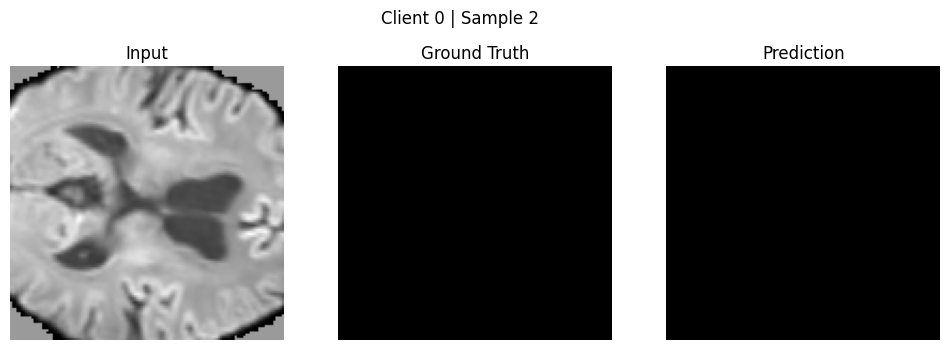

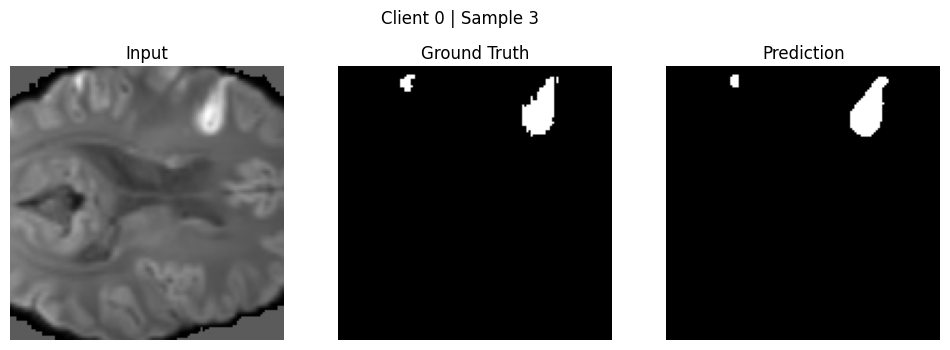

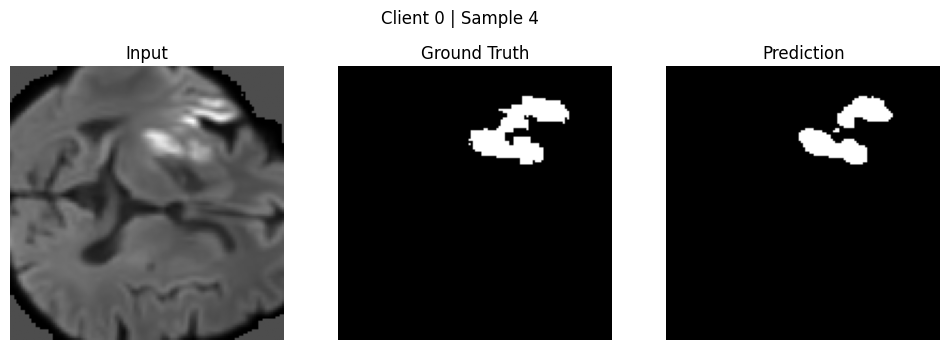

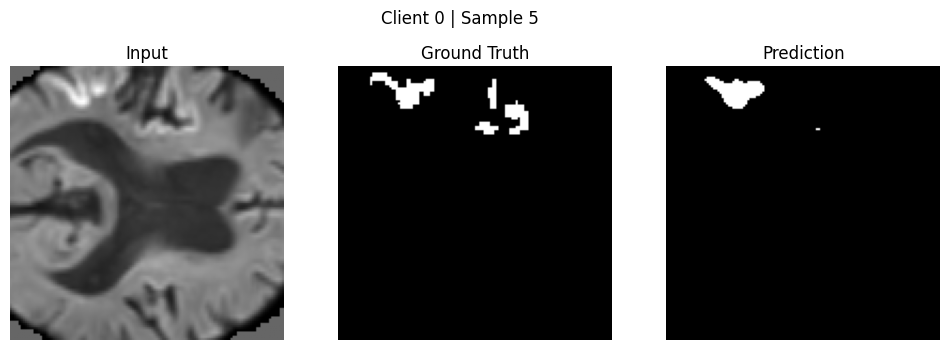

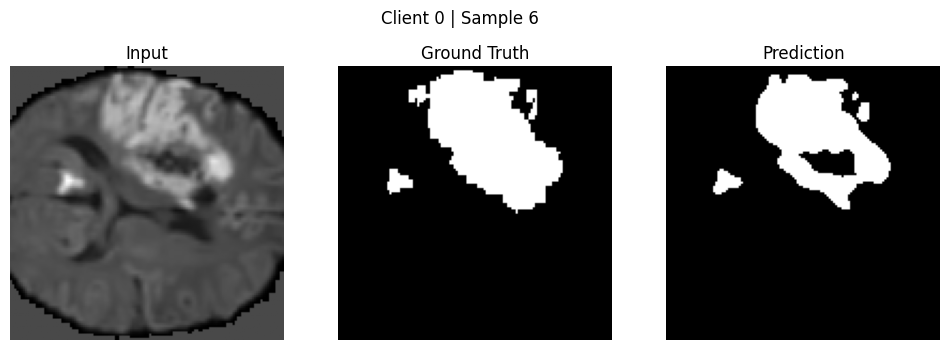

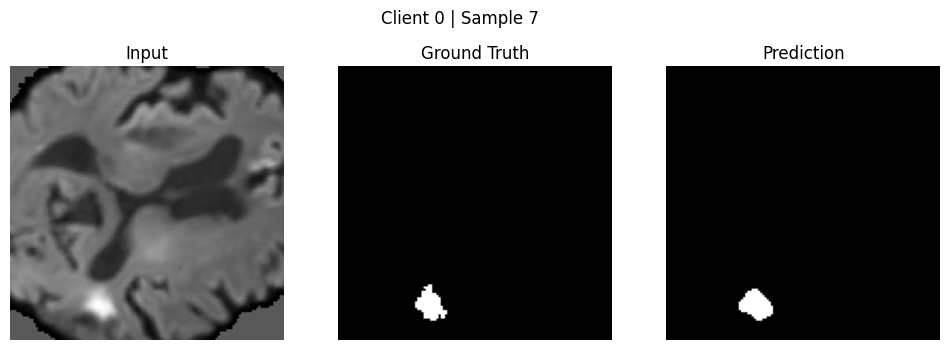

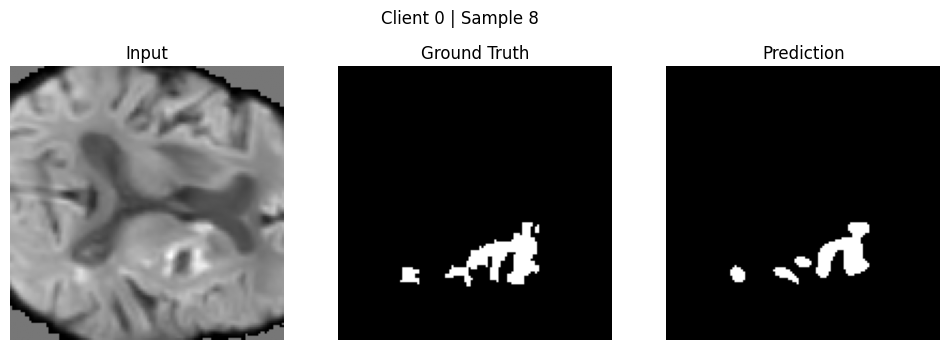

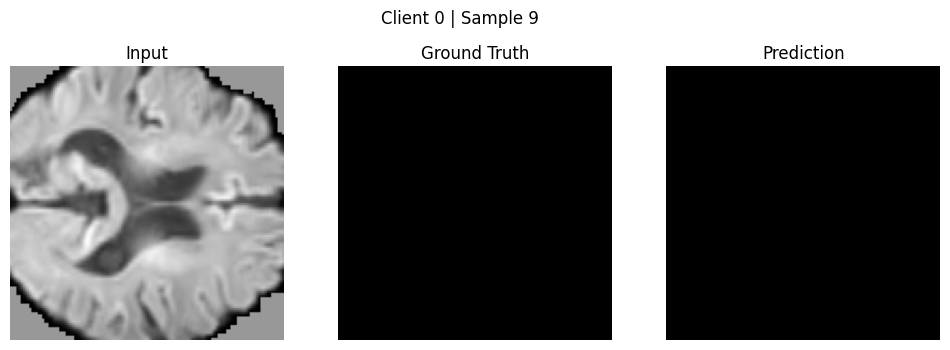

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

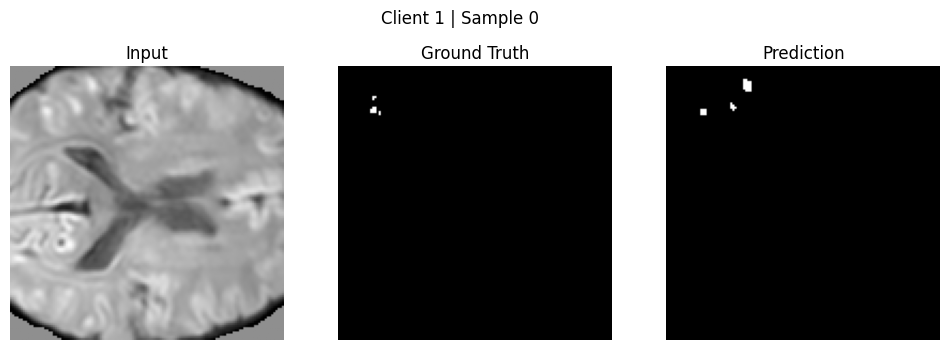

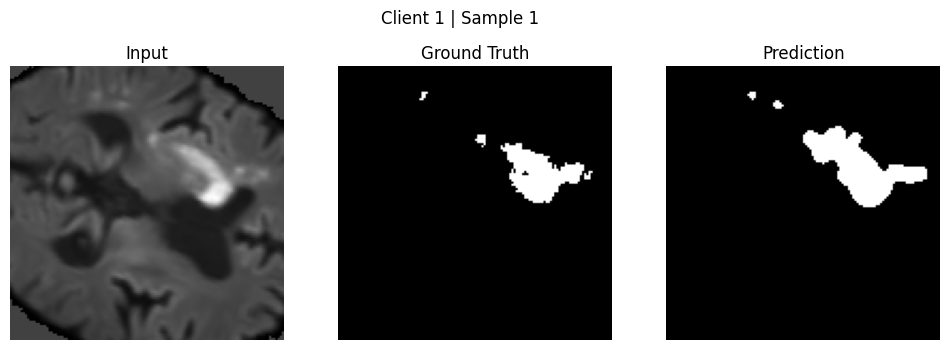

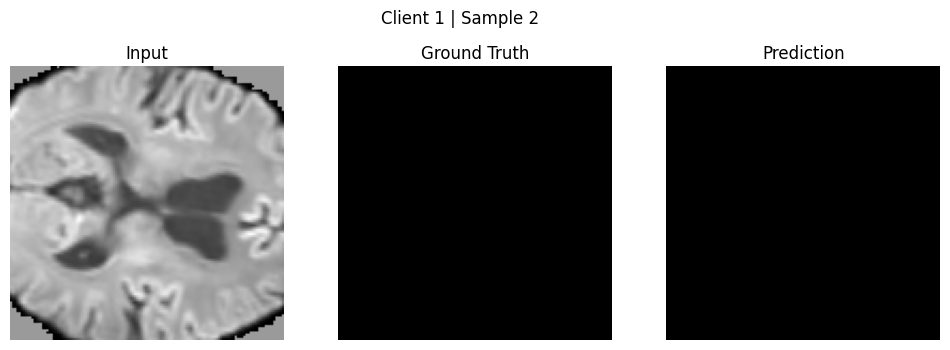

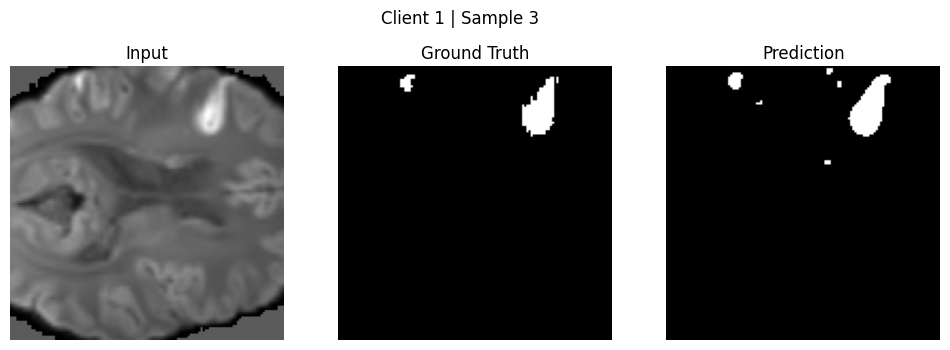

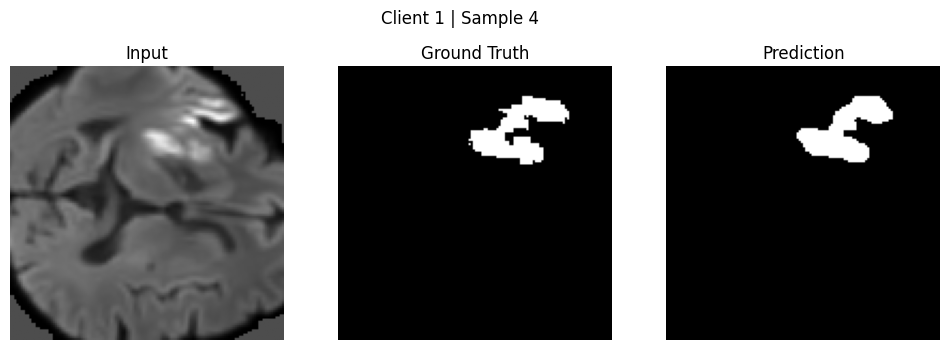

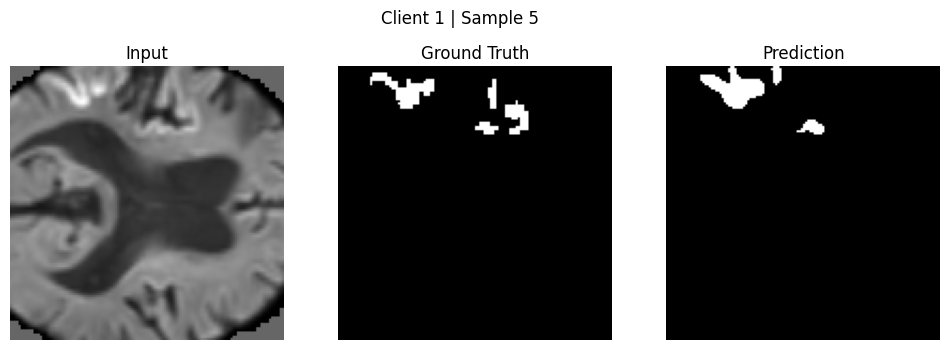

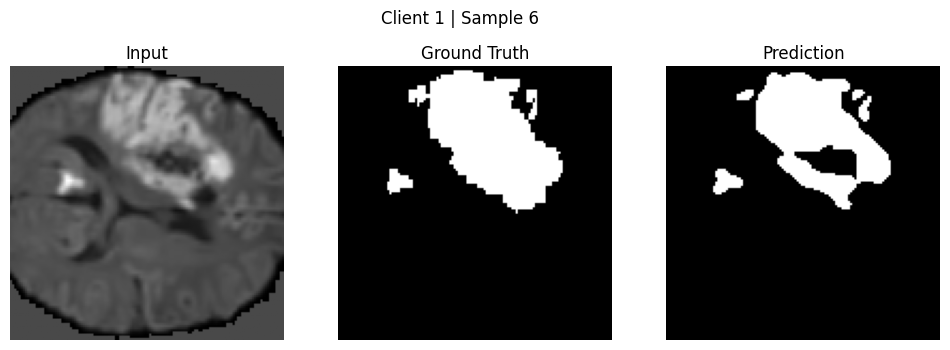

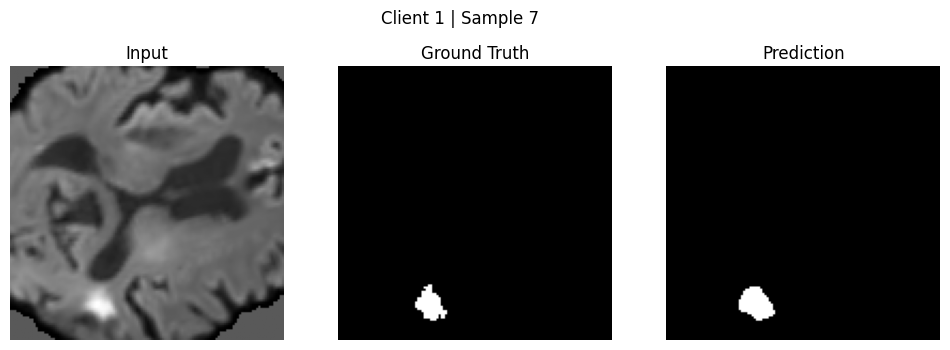

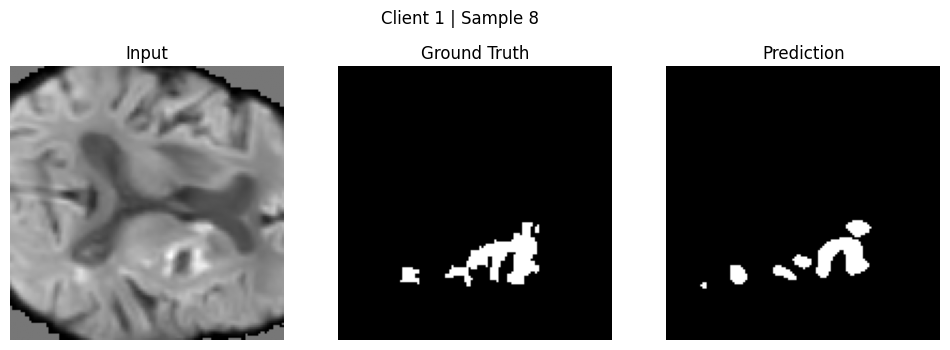

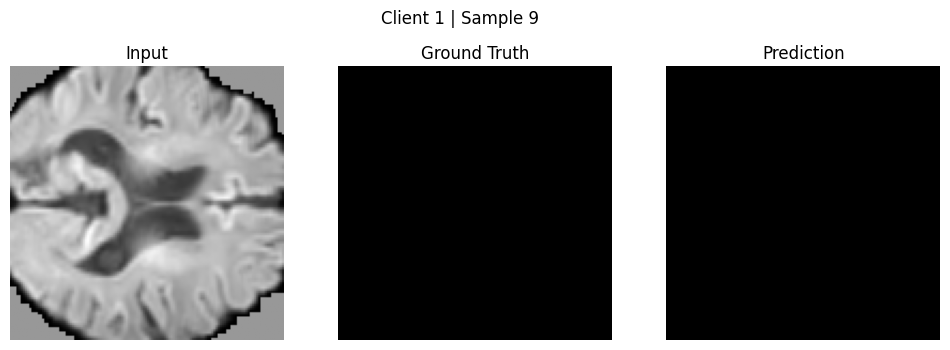

In [65]:
for client in clients:
    model = load_client_model(client.id, device)
    visualize_model(model, test_dataset, device, client.id, num_samples=10)